# Project: Wrangling and Analyze Data

## Data Gathering
In the cell below, gather **all** three pieces of data for this project and load them in the notebook. **Note:** the methods required to gather each data are different.
1. Directly download the WeRateDogs Twitter archive data (twitter_archive_enhanced.csv)

In [1]:
import warnings
warnings.filterwarnings(action='ignore')

In [2]:
import pandas as pd
import numpy as np
twitter_archive = pd.read_csv('twitter-archive-enhanced.csv')
twitter_archive.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None


2. Use the Requests library to download the tweet image prediction (image_predictions.tsv)

In [3]:
import requests
response = requests.get('https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv')

with open("image-predictions.tsv", mode='wb') as file:
    file.write(response.content)

In [4]:
response.status_code

200

In [5]:
response.headers['content-type']

'text/tab-separated-values; charset=utf-8'

In [6]:
response.content

b"tweet_id\tjpg_url\timg_num\tp1\tp1_conf\tp1_dog\tp2\tp2_conf\tp2_dog\tp3\tp3_conf\tp3_dog\n666020888022790149\thttps://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg\t1\tWelsh_springer_spaniel\t0.465074\tTrue\tcollie\t0.156665\tTrue\tShetland_sheepdog\t0.0614285\tTrue\n666029285002620928\thttps://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg\t1\tredbone\t0.506826\tTrue\tminiature_pinscher\t0.07419169999999999\tTrue\tRhodesian_ridgeback\t0.07201\tTrue\n666033412701032449\thttps://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg\t1\tGerman_shepherd\t0.596461\tTrue\tmalinois\t0.13858399999999998\tTrue\tbloodhound\t0.11619700000000001\tTrue\n666044226329800704\thttps://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg\t1\tRhodesian_ridgeback\t0.408143\tTrue\tredbone\t0.360687\tTrue\tminiature_pinscher\t0.222752\tTrue\n666049248165822465\thttps://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg\t1\tminiature_pinscher\t0.560311\tTrue\tRottweiler\t0.243682\tTrue\tDoberman\t0.154629\tTrue\n666050758794694657\thttps://pbs.twimg.com/

In [7]:
image_predictions = pd.read_csv('image-predictions.tsv', sep = '\t')
image_predictions

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
...,...,...,...,...,...,...,...,...,...,...,...,...
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True


3. Use the Tweepy library to query additional data via the Twitter API (tweet_json.txt)

In [8]:
'''import tweepy
from tweepy import OAuthHandler
import json
from timeit import default_timer as timer

# Query Twitter API for each tweet in the Twitter archive and save JSON in a text file
# These are hidden to comply with Twitter's API terms and conditions
consumer_key = 'HIDDEN'
consumer_secret = 'HIDDEN'
access_token = 'HIDDEN'
access_secret = 'HIDDEN'

auth = OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)

api = tweepy.API(auth, wait_on_rate_limit=True)

# NOTE TO STUDENT WITH MOBILE VERIFICATION ISSUES:
# df_1 is a DataFrame with the twitter_archive_enhanced.csv file. You may have to
# change line 17 to match the name of your DataFrame with twitter_archive_enhanced.csv
# NOTE TO REVIEWER: this student had mobile verification issues so the following
# Twitter API code was sent to this student from a Udacity instructor
# Tweet IDs for which to gather additional data via Twitter's API
tweet_ids = twitter_archive.tweet_id.values
len(tweet_ids)

# Query Twitter's API for JSON data for each tweet ID in the Twitter archive
count = 0
fails_dict = {}
start = timer()
# Save each tweet's returned JSON as a new line in a .txt file
with open('tweet_json.txt', 'w') as outfile:
    # This loop will likely take 20-30 minutes to run because of Twitter's rate limit
    for tweet_id in tweet_ids:
        count += 1
        print(str(count) + ": " + str(tweet_id))
        try:
            tweet = api.get_status(tweet_id, tweet_mode='extended')
            print("Success")
            json.dump(tweet._json, outfile)
            outfile.write('\n')
        except tweepy.TweepError as e:
            print("Fail")
            fails_dict[tweet_id] = e
            pass
end = timer()
print(end - start)
print(fails_dict)'''

'import tweepy\nfrom tweepy import OAuthHandler\nimport json\nfrom timeit import default_timer as timer\n\n# Query Twitter API for each tweet in the Twitter archive and save JSON in a text file\n# These are hidden to comply with Twitter\'s API terms and conditions\nconsumer_key = \'HIDDEN\'\nconsumer_secret = \'HIDDEN\'\naccess_token = \'HIDDEN\'\naccess_secret = \'HIDDEN\'\n\nauth = OAuthHandler(consumer_key, consumer_secret)\nauth.set_access_token(access_token, access_secret)\n\napi = tweepy.API(auth, wait_on_rate_limit=True)\n\n# NOTE TO STUDENT WITH MOBILE VERIFICATION ISSUES:\n# df_1 is a DataFrame with the twitter_archive_enhanced.csv file. You may have to\n# change line 17 to match the name of your DataFrame with twitter_archive_enhanced.csv\n# NOTE TO REVIEWER: this student had mobile verification issues so the following\n# Twitter API code was sent to this student from a Udacity instructor\n# Tweet IDs for which to gather additional data via Twitter\'s API\ntweet_ids = twitter

## Having issues with secret key so tweet_json.txt was employed

In [9]:
import json
from time import sleep
respons = requests.get('https://video.udacity-data.com/topher/2018/November/5be5fb7d_tweet-json/tweet-json.txt')
with open("tweet_json.txt", mode='wb') as f:
    f.write(respons.content)

In [10]:
respons.status_code

200

In [11]:
respons.text

'{"created_at": "Tue Aug 01 16:23:56 +0000 2017", "id": 892420643555336193, "id_str": "892420643555336193", "full_text": "This is Phineas. He\'s a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU", "truncated": false, "display_text_range": [0, 85], "entities": {"hashtags": [], "symbols": [], "user_mentions": [], "urls": [], "media": [{"id": 892420639486877696, "id_str": "892420639486877696", "indices": [86, 109], "media_url": "http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg", "media_url_https": "https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg", "url": "https://t.co/MgUWQ76dJU", "display_url": "pic.twitter.com/MgUWQ76dJU", "expanded_url": "https://twitter.com/dog_rates/status/892420643555336193/photo/1", "type": "photo", "sizes": {"large": {"w": 540, "h": 528, "resize": "fit"}, "thumb": {"w": 150, "h": 150, "resize": "crop"}, "small": {"w": 540, "h": 528, "resize": "fit"}, "medium": {"w": 540, "h": 528, "resize": "fit"}}}]}, "extended_entities": {"med

In [12]:
df_list = []
with open("tweet_json.txt", mode='r', encoding ='utf-8') as f:
    for i in range(2354):
        item = json.loads(f.readline())
        tweet_id = item['id_str']
        retweet_count = item['retweet_count']
        favorite_count = item['favorite_count']
        print(i, tweet_id, retweet_count, favorite_count)
        df_list.append({'tweet_id': tweet_id, 'retweet_count': retweet_count, 'favorite_count': favorite_count})
twitter_additional = pd.DataFrame(df_list, columns = ['tweet_id', 'retweet_count', 'favorite_count'])

0 892420643555336193 8853 39467
1 892177421306343426 6514 33819
2 891815181378084864 4328 25461
3 891689557279858688 8964 42908
4 891327558926688256 9774 41048
5 891087950875897856 3261 20562
6 890971913173991426 2158 12041
7 890729181411237888 16716 56848
8 890609185150312448 4429 28226
9 890240255349198849 7711 32467
10 890006608113172480 7624 31166
11 889880896479866881 5156 28268
12 889665388333682689 8538 38818
13 889638837579907072 4735 27672
14 889531135344209921 2321 15359
15 889278841981685760 5637 25652
16 888917238123831296 4709 29611
17 888804989199671297 4559 26080
18 888554962724278272 3732 20290
19 888078434458587136 3653 22201
20 887705289381826560 5609 30779
21 887517139158093824 12082 46959
22 887473957103951883 18781 69871
23 887343217045368832 10737 34222
24 887101392804085760 6167 31061
25 886983233522544640 8084 35859
26 886736880519319552 3443 12306
27 886680336477933568 4610 22798
28 886366144734445568 3316 21524
29 886267009285017600 4 117
30 886258384151887873

576 800855607700029440 1889 0
577 800751577355128832 3214 11701
578 800513324630806528 3495 14685
579 800459316964663297 2489 10538
580 800443802682937345 5068 0
581 800388270626521089 3265 12456
582 800188575492947969 4581 0
583 800141422401830912 2980 17092
584 800018252395122689 15351 31768
585 799774291445383169 5488 0
586 799757965289017345 2506 9390
587 799422933579902976 2213 8965
588 799308762079035393 6478 0
589 799297110730567681 3227 11065
590 799063482566066176 2863 9058
591 798933969379225600 5203 14712
592 798925684722855936 1663 8246
593 798705661114773508 7724 0
594 798701998996647937 9126 0
595 798697898615730177 7602 0
596 798694562394996736 5812 0
597 798686750113755136 2702 0
598 798682547630837760 5515 0
599 798673117451325440 6485 0
600 798665375516884993 4519 0
601 798644042770751489 2153 0
602 798628517273620480 2272 0
603 798585098161549313 6618 0
604 798576900688019456 6871 0
605 798340744599797760 3924 0
606 798209839306514432 2954 11548
607 79797186472332493

1320 706291001778950144 522 1861
1321 706265994973601792 1030 2979
1322 706169069255446529 2511 4291
1323 706166467411222528 1819 5636
1324 706153300320784384 437 1632
1325 705975130514706432 842 3397
1326 705970349788291072 1008 3440
1327 705898680587526145 643 2597
1328 705786532653883392 596 2132
1329 705591895322394625 1308 3475
1330 705475953783398401 1045 3231
1331 705442520700944385 1859 4877
1332 705428427625635840 1931 4188
1333 705239209544720384 854 3290
1334 705223444686888960 900 2829
1335 705102439679201280 585 2342
1336 705066031337840642 683 2378
1337 704871453724954624 1245 4585
1338 704859558691414016 612 2462
1339 704847917308362754 1727 5594
1340 704819833553219584 1136 2906
1341 704761120771465216 3257 7283
1342 704499785726889984 1124 3212
1343 704491224099647488 97 840
1344 704480331685040129 1197 3723
1345 704364645503647744 3999 8804
1346 704347321748819968 393 1729
1347 704134088924532736 519 1653
1348 704113298707505153 629 2031
1349 704054845121142784 1028 3

1989 672622327801233409 542 1377
1990 672614745925664768 644 1302
1991 672609152938721280 424 1180
1992 672604026190569472 445 1188
1993 672594978741354496 661 1411
1994 672591762242805761 367 1014
1995 672591271085670400 207 782
1996 672538107540070400 404 1089
1997 672523490734551040 189 696
1998 672488522314567680 482 1187
1999 672482722825261057 665 1221
2000 672481316919734272 137 757
2001 672475084225949696 770 1529
2002 672466075045466113 598 1447
2003 672272411274932228 3677 6888
2004 672267570918129665 666 1588
2005 672264251789176834 383 1212
2006 672256522047614977 1699 2999
2007 672254177670729728 800 1515
2008 672248013293752320 656 1833
2009 672245253877968896 169 733
2010 672239279297454080 347 953
2011 672231046314901505 1089 1956
2012 672222792075620352 231 833
2013 672205392827572224 1270 2414
2014 672169685991993344 408 1074
2015 672160042234327040 395 918
2016 672139350159835138 792 1876
2017 672125275208069120 1253 2578
2018 672095186491711488 395 1063
2019 6720821

In [13]:
twitter_additional

,tweet_id,retweet_count,favorite_count
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819
2,891815181378084864,4328,25461
3,891689557279858688,8964,42908
4,891327558926688256,9774,41048
...,...,...,...
2349,666049248165822465,41,111
2350,666044226329800704,147,311
2351,666033412701032449,47,128
2352,666029285002620928,48,132


All 3 datasets has been loaded

## Assessing Data
In this section, detect and document at least **eight (8) quality issues and two (2) tidiness issue**. You must use **both** visual assessment
programmatic assessement to assess the data.

**Note:** pay attention to the following key points when you access the data.

* You only want original ratings (no retweets) that have images. Though there are 5000+ tweets in the dataset, not all are dog ratings and some are retweets.
* Assessing and cleaning the entire dataset completely would require a lot of time, and is not necessary to practice and demonstrate your skills in data wrangling. Therefore, the requirements of this project are only to assess and clean at least 8 quality issues and at least 2 tidiness issues in this dataset.
* The fact that the rating numerators are greater than the denominators does not need to be cleaned. This [unique rating system](http://knowyourmeme.com/memes/theyre-good-dogs-brent) is a big part of the popularity of WeRateDogs.
* You do not need to gather the tweets beyond August 1st, 2017. You can, but note that you won't be able to gather the image predictions for these tweets since you don't have access to the algorithm used.



In [14]:
twitter_archive
# displays the twitter archive table

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a 1949 1st generation vulpix. Enj...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666049248...,5,10,None,None,None,None,None
2352,666044226329800704,NaN,NaN,2015-11-16 00:04:52 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a purebred Piers Morgan. Loves to Netf...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666044226...,6,10,a,None,None,None,None
2353,666033412701032449,NaN,NaN,2015-11-15 23:21:54 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here is a very happy pup. Big fan of well-main...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666033412...,9,10,a,None,None,None,None
2354,666029285002620928,NaN,NaN,2015-11-15 23:05:30 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a western brown Mitsubishi terrier. Up...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666029285...,7,10,a,None,None,None,None


In [15]:
twitter_archive.info()
# information on datatypes of the twitter_archive column

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

In [16]:
twitter_archive.describe()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,retweeted_status_id,retweeted_status_user_id,rating_numerator,rating_denominator
count,2.356000e+03,7.800000e+01,7.800000e+01,1.810000e+02,1.810000e+02,2356.000000,2356.000000
mean,7.427716e+17,7.455079e+17,2.014171e+16,7.720400e+17,1.241698e+16,13.126486,10.455433
std,6.856705e+16,7.582492e+16,1.252797e+17,6.236928e+16,9.599254e+16,45.876648,6.745237
min,6.660209e+17,6.658147e+17,1.185634e+07,6.661041e+17,7.832140e+05,0.000000,0.000000
25%,6.783989e+17,6.757419e+17,3.086374e+08,7.186315e+17,4.196984e+09,10.000000,10.000000
50%,7.196279e+17,7.038708e+17,4.196984e+09,7.804657e+17,4.196984e+09,11.000000,10.000000
75%,7.993373e+17,8.257804e+17,4.196984e+09,8.203146e+17,4.196984e+09,12.000000,10.000000
max,8.924206e+17,8.862664e+17,8.405479e+17,8.874740e+17,7.874618e+17,1776.000000,170.000000


In [17]:
twitter_archive.duplicated().sum()

0

In [18]:
twitter_archive['tweet_id'].duplicated().sum()

0

From the above code we can observe that some columns of twitter_archive has erroneous datatype, although it has no duplicated vaalue. Also it has retweets instead of tweets in some rows, inconsistent denominators rating, other tweets different from dogs tweeet(Visual)

In [19]:
image_predictions

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
...,...,...,...,...,...,...,...,...,...,...,...,...
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True


In [20]:
image_predictions[['tweet_id', 'jpg_url']].duplicated().sum()

0

In [21]:
image_predictions[image_predictions[['tweet_id', 'jpg_url']].duplicated()]

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog


In [22]:
image_predictions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [23]:
image_predictions.describe()

,tweet_id,img_num,p1_conf,p2_conf,p3_conf
count,2.075000e+03,2075.000000,2075.000000,2.075000e+03,2.075000e+03
mean,7.384514e+17,1.203855,0.594548,1.345886e-01,6.032417e-02
std,6.785203e+16,0.561875,0.271174,1.006657e-01,5.090593e-02
min,6.660209e+17,1.000000,0.044333,1.011300e-08,1.740170e-10
25%,6.764835e+17,1.000000,0.364412,5.388625e-02,1.622240e-02
50%,7.119988e+17,1.000000,0.588230,1.181810e-01,4.944380e-02
75%,7.932034e+17,1.000000,0.843855,1.955655e-01,9.180755e-02
max,8.924206e+17,4.000000,1.000000,4.880140e-01,2.734190e-01


The image prediction also has its tweet_id, img_num as integers instead of strings, non descriptive column names, some uppercase, lowercase inconsistencies in p1,p2,p3 column and dash as space(Visual  & Programmatic)

In [24]:
twitter_additional

,tweet_id,retweet_count,favorite_count
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819
2,891815181378084864,4328,25461
3,891689557279858688,8964,42908
4,891327558926688256,9774,41048
...,...,...,...
2349,666049248165822465,41,111
2350,666044226329800704,147,311
2351,666033412701032449,47,128
2352,666029285002620928,48,132


In [25]:
twitter_additional.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   tweet_id        2354 non-null   object
 1   retweet_count   2354 non-null   int64 
 2   favorite_count  2354 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 55.3+ KB


In [26]:
twitter_additional.describe()

,retweet_count,favorite_count
count,2354.000000,2354.000000
mean,3164.797366,8080.968564
std,5284.770364,11814.771334
min,0.000000,0.000000
25%,624.500000,1415.000000
50%,1473.500000,3603.500000
75%,3652.000000,10122.250000
max,79515.000000,132810.000000


In [27]:
all_columns =pd.Series(list(twitter_archive) + list(image_predictions) + list(twitter_additional))
all_columns[all_columns.duplicated()]

17    tweet_id
29    tweet_id
dtype: object

Both programmatic and visual assessment has been done and the following issues were documented

### Quality issues
1. Tweet_id not a string in twitter_archive.

2. Erroneous data_type in twitter_archive(i.e timestamp, in_reply_to_status_id, in_reply_to_user_id,  retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp).

3. Retweet instead of Tweet in some columns(i.e in rows where retweet_id is not null)

5. inconsistent rating denominator (i.e some rating denominator > 10, while some < 10)

6. Tweet about others things instead of dogs in some rows (i.e @ id= 49, 61, 64, 156, 1033, 1099, 1251, 1261, 1780, 1879)

7. Missing values in some columns


7. Some Tweets has no rating in its text ( i.e @ id = 342, 516 )

8. Tweet_id not a string in image_description.
8. Non descriptive column names in image_description table.

9. inconsistent entries in p1,p2, p3 columns sometimes lower case, upper case and also dashes inbetween words.


### Tidiness issues
1. text column contains more than 1 variable in archive_table.

2. 1 variable in 4 columns in tweeter_archive table 

2. Twitter_additional, and image_predictions should be part of tweeter_archive

## Cleaning Data
In this section, clean **all** of the issues you documented while assessing. 

**Note:** Make a copy of the original data before cleaning. Cleaning includes merging individual pieces of data according to the rules of [tidy data](https://cran.r-project.org/web/packages/tidyr/vignettes/tidy-data.html). The result should be a high-quality and tidy master pandas DataFrame (or DataFrames, if appropriate).

In [28]:
# Make copies of original pieces of data
archive_clean = twitter_archive.copy()
image_clean = image_predictions.copy()
additional_clean = twitter_additional.copy()

### Issue #1:

#### Define: 
- Convert tweet_id to string in archive_clean

#### Code

In [29]:
archive_clean['tweet_id'] = archive_clean.tweet_id.astype(str)
#converts tweet_id to string

#### Test

In [30]:
archive_clean['tweet_id'].head()

0    892420643555336193
1    892177421306343426
2    891815181378084864
3    891689557279858688
4    891327558926688256
Name: tweet_id, dtype: object

### Issue #2:

#### Define
- Convert timestamp, retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp to the right data type in archive_tweets.

#### Code

In [31]:
columns_to_string = ['retweeted_status_id' , 'retweeted_status_user_id', 'in_reply_to_status_id', 'in_reply_to_user_id']
for col in columns_to_string:
    archive_clean[col] = archive_clean[col].astype(str).replace('nan', np.nan)

In [32]:
archive_clean['timestamp'] = pd.to_datetime(archive_clean['timestamp'])

In [33]:
archive_clean['retweeted_status_timestamp']= pd.to_datetime(archive_clean['retweeted_status_timestamp'])

The above codes converts the columns that has been measured above to the right datatype

#### Test

In [34]:
archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2356 non-null   object             
 1   in_reply_to_status_id       78 non-null     object             
 2   in_reply_to_user_id         78 non-null     object             
 3   timestamp                   2356 non-null   datetime64[ns, UTC]
 4   source                      2356 non-null   object             
 5   text                        2356 non-null   object             
 6   retweeted_status_id         181 non-null    object             
 7   retweeted_status_user_id    181 non-null    object             
 8   retweeted_status_timestamp  181 non-null    datetime64[ns, UTC]
 9   expanded_urls               2297 non-null   object             
 10  rating_numerator            2356 non-null   int64           

### Issue #3:

#### Define
- Remove rows with Retweets instead of Tweet in text columns(i.e in rows where retweet_id is not null) using regex 

#### Code

In [35]:
archive_clean['text'].head(50)

0     This is Phineas. He's a mystical boy. Only eve...
1     This is Tilly. She's just checking pup on you....
2     This is Archie. He is a rare Norwegian Pouncin...
3     This is Darla. She commenced a snooze mid meal...
4     This is Franklin. He would like you to stop ca...
5     Here we have a majestic great white breaching ...
6     Meet Jax. He enjoys ice cream so much he gets ...
7     When you watch your owner call another dog a g...
8     This is Zoey. She doesn't want to be one of th...
9     This is Cassie. She is a college pup. Studying...
10    This is Koda. He is a South Australian decksha...
11    This is Bruno. He is a service shark. Only get...
12    Here's a puppo that seems to be on the fence a...
13    This is Ted. He does his best. Sometimes that'...
14    This is Stuart. He's sporting his favorite fan...
15    This is Oliver. You're witnessing one of his m...
16    This is Jim. He found a fren. Taught him how t...
17    This is Zeke. He has a new stick. Very pro

In [36]:
archive_clean['text'] = archive_clean['text'][archive_clean['text'].str.extract(r"(RT @*)", expand = False).isna()]
#Extracts all retweets instead of tweeets and convert them to NaN

In [37]:
archive_clean['text'].head(50)

0     This is Phineas. He's a mystical boy. Only eve...
1     This is Tilly. She's just checking pup on you....
2     This is Archie. He is a rare Norwegian Pouncin...
3     This is Darla. She commenced a snooze mid meal...
4     This is Franklin. He would like you to stop ca...
5     Here we have a majestic great white breaching ...
6     Meet Jax. He enjoys ice cream so much he gets ...
7     When you watch your owner call another dog a g...
8     This is Zoey. She doesn't want to be one of th...
9     This is Cassie. She is a college pup. Studying...
10    This is Koda. He is a South Australian decksha...
11    This is Bruno. He is a service shark. Only get...
12    Here's a puppo that seems to be on the fence a...
13    This is Ted. He does his best. Sometimes that'...
14    This is Stuart. He's sporting his favorite fan...
15    This is Oliver. You're witnessing one of his m...
16    This is Jim. He found a fren. Taught him how t...
17    This is Zeke. He has a new stick. Very pro

In [38]:
archive_clean.dropna(subset = ['text'], inplace = True)
#drops the retweet rows which has been cnverted to NAN above

#### Test

In [39]:
archive_clean['text'].head(50)

0     This is Phineas. He's a mystical boy. Only eve...
1     This is Tilly. She's just checking pup on you....
2     This is Archie. He is a rare Norwegian Pouncin...
3     This is Darla. She commenced a snooze mid meal...
4     This is Franklin. He would like you to stop ca...
5     Here we have a majestic great white breaching ...
6     Meet Jax. He enjoys ice cream so much he gets ...
7     When you watch your owner call another dog a g...
8     This is Zoey. She doesn't want to be one of th...
9     This is Cassie. She is a college pup. Studying...
10    This is Koda. He is a South Australian decksha...
11    This is Bruno. He is a service shark. Only get...
12    Here's a puppo that seems to be on the fence a...
13    This is Ted. He does his best. Sometimes that'...
14    This is Stuart. He's sporting his favorite fan...
15    This is Oliver. You're witnessing one of his m...
16    This is Jim. He found a fren. Taught him how t...
17    This is Zeke. He has a new stick. Very pro

### Issue #4:

#### Define
- correct inconsistent rating denominator (i.e some rating denominator > 10, while some < 10)

#### Code

In [40]:
 archive_clean[archive_clean['rating_denominator'] < 10][['timestamp', 'tweet_id','text', 'rating_numerator', 'rating_denominator']]
    #returns dataframe where denominator is less than 10

,timestamp,tweet_id,text,rating_numerator,rating_denominator
313,2017-02-24 21:54:03+00:00,835246439529840640,@jonnysun @Lin_Manuel ok jomny I know you're e...,960,0
516,2016-12-19 23:06:23+00:00,810984652412424192,Meet Sam. She smiles 24/7 &amp; secretly aspir...,24,7
2335,2015-11-16 16:11:11+00:00,666287406224695296,This is an Albanian 3 1/2 legged Episcopalian...,1,2


In [41]:
archive_clean[archive_clean['rating_denominator'] < 10].index

Int64Index([313, 516, 2335], dtype='int64')

In [42]:
for ind in archive_clean[archive_clean['rating_denominator'] < 10].index:
    print(ind, archive_clean[archive_clean['rating_denominator'] < 10][['text']].loc[ind, 'text'])
    print('\n')
    
#views the content of the tweet of those index where denominator is less than 10 to see if there's the actual rating in the tweet

313 @jonnysun @Lin_Manuel ok jomny I know you're excited but 960/00 isn't a valid rating, 13/10 is tho


516 Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. 
Keep Sam smiling by clicking and sharing this link:
https://t.co/98tB8y7y7t https://t.co/LouL5vdvxx


2335 This is an Albanian 3 1/2 legged  Episcopalian. Loves well-polished hardwood flooring. Penis on the collar. 9/10 https://t.co/d9NcXFKwLv




In [43]:
archive_clean['rating_denominator'].loc[[313, 516, 2335]] = 10
archive_clean['rating_numerator'].loc[[313, 516, 2335]] = 13, np.nan, 9
archive_clean.loc[[313,516, 2335]]
#reassign correct rating_denominator and numerator as seen in the tweet text

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
313,835246439529840640,8.35245984028504e+17,26259576.0,2017-02-24 21:54:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",@jonnysun @Lin_Manuel ok jomny I know you're e...,NaN,NaN,NaT,NaN,13.0,10,None,None,None,None,None
516,810984652412424192,NaN,NaN,2016-12-19 23:06:23+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Meet Sam. She smiles 24/7 &amp; secretly aspir...,NaN,NaN,NaT,"https://www.gofundme.com/sams-smile,https://tw...",NaN,10,Sam,None,None,None,None
2335,666287406224695296,NaN,NaN,2015-11-16 16:11:11+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is an Albanian 3 1/2 legged Episcopalian...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/666287406...,9.0,10,an,None,None,None,None


In [44]:
archive_clean[archive_clean['rating_denominator'] > 10][['timestamp', 'tweet_id','text', 'rating_numerator', 'rating_denominator']]
#returns dataframe where denominator is greater than 10

,timestamp,tweet_id,text,rating_numerator,rating_denominator
342,2017-02-16 04:45:50+00:00,832088576586297345,@docmisterio account started on 11/15/15,11.0,15
433,2017-01-15 17:52:40+00:00,820690176645140481,The floofs have been released I repeat the flo...,84.0,70
902,2016-07-28 01:00:57+00:00,758467244762497024,Why does this never happen at my front door......,165.0,150
1068,2016-06-08 02:41:38+00:00,740373189193256964,"After so many requests, this is Bretagne. She ...",9.0,11
1120,2016-05-13 16:15:54+00:00,731156023742988288,Say hello to this unbelievably well behaved sq...,204.0,170
1165,2016-04-21 02:25:47+00:00,722974582966214656,Happy 4/20 from the squad! 13/10 for all https...,4.0,20
1202,2016-04-03 01:36:11+00:00,716439118184652801,This is Bluebert. He just saw that both #Final...,50.0,50
1228,2016-03-27 01:29:02+00:00,713900603437621249,Happy Saturday here's 9 puppers on a bench. 99...,99.0,90
1254,2016-03-18 02:46:49+00:00,710658690886586372,Here's a brigade of puppers. All look very pre...,80.0,80
1274,2016-03-14 02:04:08+00:00,709198395643068416,"From left to right:\nCletus, Jerome, Alejandro...",45.0,50


In [45]:
for ind in archive_clean[archive_clean['rating_denominator'] > 10].index:
    print(ind, archive_clean[archive_clean['rating_denominator'] > 10][['text']].loc[ind, 'text'])
    print('\n')
    
#views the content of the tweet of those index where denominator is greater than 10 to see if there's the actual rating in the tweet

342 @docmisterio account started on 11/15/15


433 The floofs have been released I repeat the floofs have been released. 84/70 https://t.co/NIYC820tmd


902 Why does this never happen at my front door... 165/150 https://t.co/HmwrdfEfUE


1068 After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP https://t.co/XAVDNDaVgQ


1120 Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once https://t.co/yGQI3He3xv


1165 Happy 4/20 from the squad! 13/10 for all https://t.co/eV1diwds8a


1202 This is Bluebert. He just saw that both #FinalFur match ups are split 50/50. Amazed af. 11/10 https://t.co/Kky1DPG4iq


1228 Happy Saturday here's 9 puppers on a bench. 99/90 good work everybody https://t.co/mpvaVxKmc1


1254 Here's a brigade of puppers. All look very prepared for whatever happens next. 80/80 https://t.co/0eb7R1Om12


1274 From left to right:
Cletus, Jerome, Alejandro, Burp, &amp; Titson


After examining the tweeet text we found that dates were represented as rating for some dogs that has their actual rating in the same text.
only 1 of them had no actual rating. Also some rating only needed to be simplified to a denominator of 10. Therefore I split the index into two list 1. **misplaced_rating and recalculate rating**

In [46]:
archive_clean[archive_clean['rating_denominator'] > 10].index

Int64Index([ 342,  433,  902, 1068, 1120, 1165, 1202, 1228, 1254, 1274, 1351,
            1433, 1598, 1634, 1635, 1662, 1663, 1779, 1843],
           dtype='int64')

In [47]:
misplaced_rating_index = [342, 1068, 1165, 1202, 1662]
misplaced_rating_index

[342, 1068, 1165, 1202, 1662]

In [48]:
for i in range(len(misplaced_rating_index)) :
    archive_clean['rating_denominator'].loc[misplaced_rating_index[i]] = 10

In [49]:
archive_clean['rating_numerator'].loc[misplaced_rating_index] = np.nan, 14, 13, 11, 10

In [50]:
recalculate_rating_index= [433, 902, 1120,  1228, 1254, 1274, 1351,1433, 1598, 1634, 1635, 1663, 1779, 1843]

In [51]:
archive_clean.loc[recalculate_rating_index][['timestamp', 'tweet_id','text', 'rating_numerator', 'rating_denominator']]

,timestamp,tweet_id,text,rating_numerator,rating_denominator
433,2017-01-15 17:52:40+00:00,820690176645140481,The floofs have been released I repeat the flo...,84.0,70
902,2016-07-28 01:00:57+00:00,758467244762497024,Why does this never happen at my front door......,165.0,150
1120,2016-05-13 16:15:54+00:00,731156023742988288,Say hello to this unbelievably well behaved sq...,204.0,170
1228,2016-03-27 01:29:02+00:00,713900603437621249,Happy Saturday here's 9 puppers on a bench. 99...,99.0,90
1254,2016-03-18 02:46:49+00:00,710658690886586372,Here's a brigade of puppers. All look very pre...,80.0,80
1274,2016-03-14 02:04:08+00:00,709198395643068416,"From left to right:\nCletus, Jerome, Alejandro...",45.0,50
1351,2016-02-28 21:25:30+00:00,704054845121142784,Here is a whole flock of puppers. 60/50 I'll ...,60.0,50
1433,2016-02-10 16:51:59+00:00,697463031882764288,Happy Wednesday here's a bucket of pups. 44/40...,44.0,40
1598,2016-01-10 04:04:10+00:00,686035780142297088,Yes I do realize a rating of 4/20 would've bee...,4.0,20
1634,2016-01-05 04:11:44+00:00,684225744407494656,"Two sneaky puppers were not initially seen, mo...",143.0,130


In [52]:
archive_clean['rating_numerator'][recalculate_rating_index] = archive_clean.loc[recalculate_rating_index]['rating_numerator'] * 10//(archive_clean.loc[recalculate_rating_index]['rating_denominator'])
archive_clean['rating_denominator'][recalculate_rating_index] = 10

In [53]:
archive_clean['rating_numerator'][recalculate_rating_index]

433     12.0
902     11.0
1120    12.0
1228    11.0
1254    10.0
1274     9.0
1351    12.0
1433    11.0
1598     2.0
1634    11.0
1635    11.0
1663    12.0
1779    12.0
1843    11.0
Name: rating_numerator, dtype: float64

**The above codes were used to reassign the correct rating for the misplaced and recalculate rating index and np.nan was used for the only index with no actual rating**

#### Test

In [54]:
archive_clean.loc[misplaced_rating_index]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
342,832088576586297345,8.320875475599974e+17,30582082.0,2017-02-16 04:45:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",@docmisterio account started on 11/15/15,NaN,NaN,NaT,NaN,NaN,10,None,None,None,None,None
1068,740373189193256964,NaN,NaN,2016-06-08 02:41:38+00:00,"<a href=""http://twitter.com/download/iphone"" r...","After so many requests, this is Bretagne. She ...",NaN,NaN,NaT,https://twitter.com/dog_rates/status/740373189...,14.0,10,None,None,None,None,None
1165,722974582966214656,NaN,NaN,2016-04-21 02:25:47+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Happy 4/20 from the squad! 13/10 for all https...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/722974582...,13.0,10,None,None,None,None,None
1202,716439118184652801,NaN,NaN,2016-04-03 01:36:11+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Bluebert. He just saw that both #Final...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/716439118...,11.0,10,Bluebert,None,None,None,None
1662,682962037429899265,NaN,NaN,2016-01-01 16:30:13+00:00,"<a href=""http://twitter.com/download/iphone"" r...",This is Darrel. He just robbed a 7/11 and is i...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/682962037...,10.0,10,Darrel,None,None,None,None


In [55]:
archive_clean.loc[recalculate_rating_index][['timestamp', 'tweet_id','text', 'rating_numerator', 'rating_denominator']]

,timestamp,tweet_id,text,rating_numerator,rating_denominator
433,2017-01-15 17:52:40+00:00,820690176645140481,The floofs have been released I repeat the flo...,12.0,10
902,2016-07-28 01:00:57+00:00,758467244762497024,Why does this never happen at my front door......,11.0,10
1120,2016-05-13 16:15:54+00:00,731156023742988288,Say hello to this unbelievably well behaved sq...,12.0,10
1228,2016-03-27 01:29:02+00:00,713900603437621249,Happy Saturday here's 9 puppers on a bench. 99...,11.0,10
1254,2016-03-18 02:46:49+00:00,710658690886586372,Here's a brigade of puppers. All look very pre...,10.0,10
1274,2016-03-14 02:04:08+00:00,709198395643068416,"From left to right:\nCletus, Jerome, Alejandro...",9.0,10
1351,2016-02-28 21:25:30+00:00,704054845121142784,Here is a whole flock of puppers. 60/50 I'll ...,12.0,10
1433,2016-02-10 16:51:59+00:00,697463031882764288,Happy Wednesday here's a bucket of pups. 44/40...,11.0,10
1598,2016-01-10 04:04:10+00:00,686035780142297088,Yes I do realize a rating of 4/20 would've bee...,2.0,10
1634,2016-01-05 04:11:44+00:00,684225744407494656,"Two sneaky puppers were not initially seen, mo...",11.0,10


In [56]:
archive_clean[archive_clean['rating_denominator'] > 10]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo


In [57]:
archive_clean[archive_clean['rating_denominator'] < 10]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo


### Issue #5:

#### Define
- Tweet about others things instead of dogs in some rows (i.e @ id= 47, 59, 62, 154,735, 1031, 1097, 1249, 1259, 1778, 1877)

#### Code

In [58]:
tweet_not_dog = [47, 59, 62, 154,735, 1031, 1097, 1249, 1259, 1778, 1877]
for i in tweet_not_dog:
    print(archive_clean['text'].loc[i])
    print('\n')
    
#views text of some tweets that were not for dogs

Please only send dogs. We don't rate mechanics, no matter how h*ckin good. Thank you... 13/10 would sneak a pat https://t.co/Se5fZ9wp5E


Ugh not again. We only rate dogs. Please don't send in well-dressed  floppy-tongued street penguins. Dogs only please. Thank you... 12/10 https://t.co/WiAMbTkDPf


Please don't send in photos without dogs in them. We're not @porch_rates. Insubordinate and churlish. Pretty good porch tho 11/10 https://t.co/HauE8M3Bu4


We only rate dogs. Please don't send perfectly toasted marshmallows attempting to drive. Thank you... 13/10 https://t.co/nvZyyrp0kd


We normally don't rate lobsters, but this one appears to be a really good lobster. 10/10 would pet with caution https://t.co/YkHc7U7uUy


We only rate dogs. Pls stop sending in non-canines like this Jamaican Flop Seal. This is very very frustrating. 9/10 https://t.co/nc53zEN0hZ


We only rate dogs. Please stop sending in non-canines like this Alaskan Flop Turtle. This is very frustrating. 10/10 https://t.

In [59]:
archive_clean.loc[tweet_not_dog]
#locate the rows of some tweets which are not on dogs tweet

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
47,883117836046086144,NaN,NaN,2017-07-07 00:17:54+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Please only send dogs. We don't rate mechanics...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/883117836...,13.0,10,None,None,None,None,None
59,880872448815771648,NaN,NaN,2017-06-30 19:35:32+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Ugh not again. We only rate dogs. Please don't...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/880872448...,12.0,10,None,None,None,None,None
62,880095782870896641,NaN,NaN,2017-06-28 16:09:20+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Please don't send in photos without dogs in th...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/880095782...,11.0,10,None,None,None,None,None
154,862096992088072192,NaN,NaN,2017-05-10 00:08:34+00:00,"<a href=""http://twitter.com/download/iphone"" r...",We only rate dogs. Please don't send perfectly...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/862096992...,13.0,10,None,None,None,None,None
735,781163403222056960,NaN,NaN,2016-09-28 16:07:23+00:00,"<a href=""http://twitter.com/download/iphone"" r...","We normally don't rate lobsters, but this one ...",NaN,NaN,NaT,https://twitter.com/dog_rates/status/781163403...,10.0,10,None,None,None,None,None
1031,745422732645535745,NaN,NaN,2016-06-22 01:06:43+00:00,"<a href=""http://twitter.com/download/iphone"" r...",We only rate dogs. Pls stop sending in non-can...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/745422732...,9.0,10,very,None,None,None,None
1097,736225175608430592,NaN,NaN,2016-05-27 15:58:54+00:00,"<a href=""http://twitter.com/download/iphone"" r...",We only rate dogs. Please stop sending in non-...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/736225175...,10.0,10,very,None,None,None,None
1249,711306686208872448,NaN,NaN,2016-03-19 21:41:44+00:00,"<a href=""http://twitter.com/download/iphone"" r...",What hooligan sent in pictures w/out a dog in ...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/711306686...,3.0,10,None,None,None,None,None
1259,710272297844797440,NaN,NaN,2016-03-17 01:11:26+00:00,"<a href=""http://twitter.com/download/iphone"" r...",We 👏🏻 only 👏🏻 rate 👏🏻 dogs. Pls stop sending i...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/710272297...,11.0,10,infuriating,None,None,None,None
1778,677895101218201600,NaN,NaN,2015-12-18 16:56:01+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Guys this was terrifying. Really spooked me up...,NaN,NaN,NaT,https://twitter.com/dog_rates/status/677895101...,9.0,10,None,None,None,None,None


In [60]:
archive_clean.drop(index = tweet_not_dog, axis= 0, inplace = True)
#drop the rows of the following tweets above as it does not constitute the type of data we are building.

#### Test

archive_clean.loc[tweet_not_dog]

__This will return an error because the index had been dropped__

In [61]:
archive_clean['text'].head(50)

0     This is Phineas. He's a mystical boy. Only eve...
1     This is Tilly. She's just checking pup on you....
2     This is Archie. He is a rare Norwegian Pouncin...
3     This is Darla. She commenced a snooze mid meal...
4     This is Franklin. He would like you to stop ca...
5     Here we have a majestic great white breaching ...
6     Meet Jax. He enjoys ice cream so much he gets ...
7     When you watch your owner call another dog a g...
8     This is Zoey. She doesn't want to be one of th...
9     This is Cassie. She is a college pup. Studying...
10    This is Koda. He is a South Australian decksha...
11    This is Bruno. He is a service shark. Only get...
12    Here's a puppo that seems to be on the fence a...
13    This is Ted. He does his best. Sometimes that'...
14    This is Stuart. He's sporting his favorite fan...
15    This is Oliver. You're witnessing one of his m...
16    This is Jim. He found a fren. Taught him how t...
17    This is Zeke. He has a new stick. Very pro

### Issue #6:

#### Define
- Drop columns with absolute Missing values in all its rows.

#### Code

__As a result of dropping some rows previously we got some columns with absolute missing values(i.e all its rows are non-existent) so these columns are redundant and we should drop them.__

In [62]:
archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2160 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2160 non-null   object             
 1   in_reply_to_status_id       78 non-null     object             
 2   in_reply_to_user_id         78 non-null     object             
 3   timestamp                   2160 non-null   datetime64[ns, UTC]
 4   source                      2160 non-null   object             
 5   text                        2160 non-null   object             
 6   retweeted_status_id         0 non-null      object             
 7   retweeted_status_user_id    0 non-null      object             
 8   retweeted_status_timestamp  0 non-null      datetime64[ns, UTC]
 9   expanded_urls               2102 non-null   object             
 10  rating_numerator            2158 non-null   float64         

In [63]:
archive_clean.drop(labels = ['retweeted_status_id', 'retweeted_status_user_id', 'retweeted_status_timestamp'], axis = 1, inplace = True)

Missing values in columns such as in_reply_to_status_id, in_reply_to_user_id, may be due to conversion error from one software to another. We won't drop this columns as we will give the decision to the EDA expert to decide on

#### Test

In [64]:
archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2160 entries, 0 to 2355
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype              
---  ------                 --------------  -----              
 0   tweet_id               2160 non-null   object             
 1   in_reply_to_status_id  78 non-null     object             
 2   in_reply_to_user_id    78 non-null     object             
 3   timestamp              2160 non-null   datetime64[ns, UTC]
 4   source                 2160 non-null   object             
 5   text                   2160 non-null   object             
 6   expanded_urls          2102 non-null   object             
 7   rating_numerator       2158 non-null   float64            
 8   rating_denominator     2160 non-null   int64              
 9   name                   2160 non-null   object             
 10  doggo                  2160 non-null   object             
 11  floofer                2160 non-null   object           

### Issue #7:

#### Define
- Only sam with id =516  and id = 342 has no actual rating in its text

#### Code

In [65]:
print(archive_clean[archive_clean['rating_numerator'].isna()]['text'])

342             @docmisterio account started on 11/15/15
516    Meet Sam. She smiles 24/7 &amp; secretly aspir...
Name: text, dtype: object


In [66]:
archive_clean['rating_numerator'][516]
archive_clean['rating_denominator'][516]

10

Also, the decision of dropping this two columns will be decided during EDA. As this two columns are what we have encountered previously when filling values for the rows with denominator < 10 and > 10

#### Test

In [67]:
archive_clean[archive_clean['rating_numerator'].isna()]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
342,832088576586297345,8.320875475599974e+17,30582082.0,2017-02-16 04:45:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",@docmisterio account started on 11/15/15,NaN,NaN,10,None,None,None,None,None
516,810984652412424192,NaN,NaN,2016-12-19 23:06:23+00:00,"<a href=""http://twitter.com/download/iphone"" r...",Meet Sam. She smiles 24/7 &amp; secretly aspir...,"https://www.gofundme.com/sams-smile,https://tw...",NaN,10,Sam,None,None,None,None


### Issue #8:

#### Define
- Convert tweet_id to string in image_description

#### Code

In [68]:
image_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [69]:
image_clean['tweet_id'] = image_clean['tweet_id'].astype(str)
#converts column to string type

In [70]:
image_clean['img_num'] = image_clean['img_num'].astype(str)
#converts column to string type

#### Test

In [71]:
image_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   object 
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   object 
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), object(6)
memory usage: 152.1+ KB


### Issue #9:

#### Define
- Rename columns of Non descriptive column names in image_description table

#### Code

In [72]:
column_rename = {'jpg_url': 'image_url','img_num': 'image_count','p1':'1st_image_prediction' , 'p2':'2nd_image_prediction', 'p3': '3rd_image_prediction', 'p1_conf': '1st_image_confidence_level', 'p2_conf': '2nd_image_confidence_level', 'p3_conf': '3rd_image_confidence_level', 'p1_dog': '1st_is_a_dog_breed', 'p2_dog': '2nd_is_a_dog_breed', 'p3_dog': '3rd_is_a_dog_breed'}

In [73]:
image_clean.rename(columns = column_rename, inplace = True)
#Rename the column names with more descriptive title

#### Test

In [74]:
image_clean

,tweet_id,image_url,image_count,1st_image_prediction,1st_image_confidence_level,1st_is_a_dog_breed,2nd_image_prediction,2nd_image_confidence_level,2nd_is_a_dog_breed,3rd_image_prediction,3rd_image_confidence_level,3rd_is_a_dog_breed
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
...,...,...,...,...,...,...,...,...,...,...,...,...
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True


### Issue #10:

#### Define
- correct inconsistent entries in p1,p2, p3 columns sometimes lower case, upper case and also dashes inbetween words

#### Code

In [75]:
image_clean['1st_image_prediction'] = image_clean['1st_image_prediction'].str.title().str.replace('_', ' ')
image_clean['2nd_image_prediction'] = image_clean['2nd_image_prediction'].str.title().str.replace('_', ' ')
image_clean['3rd_image_prediction'] = image_clean['3rd_image_prediction'].str.title().str.replace('_', ' ')
#cleans the inconsistencies in the columns as defined above

#### Test

In [76]:
image_clean

,tweet_id,image_url,image_count,1st_image_prediction,1st_image_confidence_level,1st_is_a_dog_breed,2nd_image_prediction,2nd_image_confidence_level,2nd_is_a_dog_breed,3rd_image_prediction,3rd_image_confidence_level,3rd_is_a_dog_breed
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh Springer Spaniel,0.465074,True,Collie,0.156665,True,Shetland Sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,Redbone,0.506826,True,Miniature Pinscher,0.074192,True,Rhodesian Ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German Shepherd,0.596461,True,Malinois,0.138584,True,Bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian Ridgeback,0.408143,True,Redbone,0.360687,True,Miniature Pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,Miniature Pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
...,...,...,...,...,...,...,...,...,...,...,...,...
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,Basset,0.555712,True,English Springer,0.225770,True,German Short-Haired Pointer,0.175219,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,Paper Towel,0.170278,False,Labrador Retriever,0.168086,True,Spatula,0.040836,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,Malamute,0.078253,True,Kelpie,0.031379,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,Papillon,0.068957,True


### Tidiness

### Issue #1:

#### Define
- Drop Text column because it contains more than 1 variable. 

#### Code

In [77]:
archive_clean.drop(labels = 'text', axis =1, inplace = True)
'''we dropped the text column because it has become not needed as it contains 
    more than 1 variable whereas all those variables needed from it are already columns of their own'''

'we dropped the text column because it has become not needed as it contains \n    more than 1 variable whereas all those variables needed from it are already columns of their own'

#### Test

In [78]:
archive_clean

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/892420643...,13.0,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/892177421...,13.0,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/891815181...,12.0,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/891689557...,13.0,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/891327558...,12.0,10,Franklin,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666049248...,5.0,10,None,None,None,None,None
2352,666044226329800704,NaN,NaN,2015-11-16 00:04:52+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666044226...,6.0,10,a,None,None,None,None
2353,666033412701032449,NaN,NaN,2015-11-15 23:21:54+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666033412...,9.0,10,a,None,None,None,None
2354,666029285002620928,NaN,NaN,2015-11-15 23:05:30+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666029285...,7.0,10,a,None,None,None,None


### Issue #2:

#### Define
- Reshape the variables in 4 columns in tweeter_archive table as 1

#### Code

In [79]:
archive_clean3 =archive_clean.copy()

In [80]:
archive_clean3

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/892420643...,13.0,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/892177421...,13.0,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/891815181...,12.0,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/891689557...,13.0,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/891327558...,12.0,10,Franklin,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666049248...,5.0,10,None,None,None,None,None
2352,666044226329800704,NaN,NaN,2015-11-16 00:04:52+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666044226...,6.0,10,a,None,None,None,None
2353,666033412701032449,NaN,NaN,2015-11-15 23:21:54+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666033412...,9.0,10,a,None,None,None,None
2354,666029285002620928,NaN,NaN,2015-11-15 23:05:30+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666029285...,7.0,10,a,None,None,None,None


In [81]:
archive_clean3['None'] = 'None'

In [82]:
archive_clean3.columns

Index(['tweet_id', 'in_reply_to_status_id', 'in_reply_to_user_id', 'timestamp',
       'source', 'expanded_urls', 'rating_numerator', 'rating_denominator',
       'name', 'doggo', 'floofer', 'pupper', 'puppo', 'None'],
      dtype='object')

In [83]:
archive_clean3

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,None
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/892420643...,13.0,10,Phineas,None,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/892177421...,13.0,10,Tilly,None,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/891815181...,12.0,10,Archie,None,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/891689557...,13.0,10,Darla,None,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/891327558...,12.0,10,Franklin,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666049248...,5.0,10,None,None,None,None,None,None
2352,666044226329800704,NaN,NaN,2015-11-16 00:04:52+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666044226...,6.0,10,a,None,None,None,None,None
2353,666033412701032449,NaN,NaN,2015-11-15 23:21:54+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666033412...,9.0,10,a,None,None,None,None,None
2354,666029285002620928,NaN,NaN,2015-11-15 23:05:30+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666029285...,7.0,10,a,None,None,None,None,None


In [84]:
archive_clean3 = pd.melt(archive_clean3, id_vars = ['tweet_id', 'in_reply_to_status_id', 'in_reply_to_user_id', 'timestamp',
       'source', 'expanded_urls', 'rating_numerator',
       'rating_denominator', 'name'], var_name = 'dogs_stages', value_name ='dog_stage')

In [85]:
archive_clean3

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,expanded_urls,rating_numerator,rating_denominator,name,dogs_stages,dog_stage
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/892420643...,13.0,10,Phineas,doggo,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/892177421...,13.0,10,Tilly,doggo,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/891815181...,12.0,10,Archie,doggo,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/891689557...,13.0,10,Darla,doggo,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/891327558...,12.0,10,Franklin,doggo,None
...,...,...,...,...,...,...,...,...,...,...,...
10795,666049248165822465,NaN,NaN,2015-11-16 00:24:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666049248...,5.0,10,None,None,None
10796,666044226329800704,NaN,NaN,2015-11-16 00:04:52+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666044226...,6.0,10,a,None,None
10797,666033412701032449,NaN,NaN,2015-11-15 23:21:54+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666033412...,9.0,10,a,None,None
10798,666029285002620928,NaN,NaN,2015-11-15 23:05:30+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666029285...,7.0,10,a,None,None


In [86]:
archive_clean3 = archive_clean3[archive_clean3['dogs_stages'] == archive_clean3['dog_stage']]
archive_clean3

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,expanded_urls,rating_numerator,rating_denominator,name,dogs_stages,dog_stage
9,890240255349198849,NaN,NaN,2017-07-26 15:59:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/890240255...,14.0,10,Cassie,doggo,doggo
40,884162670584377345,NaN,NaN,2017-07-09 21:29:42+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/884162670...,12.0,10,Yogi,doggo,doggo
86,872967104147763200,NaN,NaN,2017-06-09 00:02:31+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/872967104...,12.0,10,None,doggo,doggo
94,871515927908634625,NaN,NaN,2017-06-04 23:56:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/871515927...,12.0,10,Napolean,doggo,doggo
95,871102520638267392,NaN,NaN,2017-06-03 20:33:19+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/animalcog/status/871075758...,14.0,10,None,doggo,doggo
...,...,...,...,...,...,...,...,...,...,...,...
10795,666049248165822465,NaN,NaN,2015-11-16 00:24:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666049248...,5.0,10,None,None,None
10796,666044226329800704,NaN,NaN,2015-11-16 00:04:52+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666044226...,6.0,10,a,None,None
10797,666033412701032449,NaN,NaN,2015-11-15 23:21:54+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666033412...,9.0,10,a,None,None
10798,666029285002620928,NaN,NaN,2015-11-15 23:05:30+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666029285...,7.0,10,a,None,None


In [89]:
#assert archive_clean.shape[0] == archive_clean3.shape[0]
# returns an error because we haven'tgotten the desired result

In [90]:
archive_clean3[archive_clean3['tweet_id'].duplicated()]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,expanded_urls,rating_numerator,rating_denominator,name,dogs_stages,dog_stage
2328,854010172552949760,NaN,NaN,2017-04-17 16:34:26+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/854010172...,11.0,10,None,floofer,floofer
4698,817777686764523521,NaN,NaN,2017-01-07 16:59:28+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/817777686...,13.0,10,Dido,pupper,pupper
4758,808106460588765185,NaN,NaN,2016-12-12 00:29:28+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/808106460...,12.0,10,None,pupper,pupper
4783,802265048156610565,7.33109485275861e+17,4196983835.0,2016-11-25 21:37:47+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/802265048...,11.0,10,None,pupper,pupper
4790,801115127852503040,NaN,NaN,2016-11-22 17:28:25+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/801115127...,12.0,10,Bones,pupper,pupper
...,...,...,...,...,...,...,...,...,...,...,...
10441,672594978741354496,NaN,NaN,2015-12-04 01:55:13+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/672594978...,9.0,10,Scott,None,None
10448,672481316919734272,NaN,NaN,2015-12-03 18:23:34+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/672481316...,12.0,10,Jazz,None,None
10455,672254177670729728,NaN,NaN,2015-12-03 03:21:00+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/672254177...,11.0,10,Rolf,None,None
10461,672205392827572224,NaN,NaN,2015-12-03 00:07:09+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/672205392...,9.0,10,Opal,None,None


In [91]:
archive_clean3.drop_duplicates(subset = ['tweet_id'], inplace =True, ignore_index = True)

In [92]:
archive_clean3.drop(['dogs_stages'], axis =1, inplace = True)
archive_clean3

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,expanded_urls,rating_numerator,rating_denominator,name,dog_stage
0,890240255349198849,NaN,NaN,2017-07-26 15:59:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/890240255...,14.0,10,Cassie,doggo
1,884162670584377345,NaN,NaN,2017-07-09 21:29:42+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/884162670...,12.0,10,Yogi,doggo
2,872967104147763200,NaN,NaN,2017-06-09 00:02:31+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/872967104...,12.0,10,None,doggo
3,871515927908634625,NaN,NaN,2017-06-04 23:56:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/871515927...,12.0,10,Napolean,doggo
4,871102520638267392,NaN,NaN,2017-06-03 20:33:19+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/animalcog/status/871075758...,14.0,10,None,doggo
...,...,...,...,...,...,...,...,...,...,...
2155,666049248165822465,NaN,NaN,2015-11-16 00:24:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666049248...,5.0,10,None,None
2156,666044226329800704,NaN,NaN,2015-11-16 00:04:52+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666044226...,6.0,10,a,None
2157,666033412701032449,NaN,NaN,2015-11-15 23:21:54+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666033412...,9.0,10,a,None
2158,666029285002620928,NaN,NaN,2015-11-15 23:05:30+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666029285...,7.0,10,a,None


In [93]:
archive_clean3[['name', 'dog_stage']] = archive_clean3[['name', 'dog_stage']].replace('None', np.nan)
archive_clean3

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,expanded_urls,rating_numerator,rating_denominator,name,dog_stage
0,890240255349198849,NaN,NaN,2017-07-26 15:59:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/890240255...,14.0,10,Cassie,doggo
1,884162670584377345,NaN,NaN,2017-07-09 21:29:42+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/884162670...,12.0,10,Yogi,doggo
2,872967104147763200,NaN,NaN,2017-06-09 00:02:31+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/872967104...,12.0,10,NaN,doggo
3,871515927908634625,NaN,NaN,2017-06-04 23:56:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/871515927...,12.0,10,Napolean,doggo
4,871102520638267392,NaN,NaN,2017-06-03 20:33:19+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/animalcog/status/871075758...,14.0,10,NaN,doggo
...,...,...,...,...,...,...,...,...,...,...
2155,666049248165822465,NaN,NaN,2015-11-16 00:24:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666049248...,5.0,10,NaN,NaN
2156,666044226329800704,NaN,NaN,2015-11-16 00:04:52+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666044226...,6.0,10,a,NaN
2157,666033412701032449,NaN,NaN,2015-11-15 23:21:54+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666033412...,9.0,10,a,NaN
2158,666029285002620928,NaN,NaN,2015-11-15 23:05:30+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666029285...,7.0,10,a,NaN


The last 4 columns of the archive_clean table should be a single column with those title names as its value.
A copy was made so as to account for the no of rows of the resulting dataframe.
This was done using the melt function and all unneeded columns and duplicate rows were dropped.

#### Test

In [94]:
assert archive_clean.shape[0] == archive_clean3.shape[0]

In [95]:
archive_clean3

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,expanded_urls,rating_numerator,rating_denominator,name,dog_stage
0,890240255349198849,NaN,NaN,2017-07-26 15:59:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/890240255...,14.0,10,Cassie,doggo
1,884162670584377345,NaN,NaN,2017-07-09 21:29:42+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/884162670...,12.0,10,Yogi,doggo
2,872967104147763200,NaN,NaN,2017-06-09 00:02:31+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/872967104...,12.0,10,NaN,doggo
3,871515927908634625,NaN,NaN,2017-06-04 23:56:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/871515927...,12.0,10,Napolean,doggo
4,871102520638267392,NaN,NaN,2017-06-03 20:33:19+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/animalcog/status/871075758...,14.0,10,NaN,doggo
...,...,...,...,...,...,...,...,...,...,...
2155,666049248165822465,NaN,NaN,2015-11-16 00:24:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666049248...,5.0,10,NaN,NaN
2156,666044226329800704,NaN,NaN,2015-11-16 00:04:52+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666044226...,6.0,10,a,NaN
2157,666033412701032449,NaN,NaN,2015-11-15 23:21:54+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666033412...,9.0,10,a,NaN
2158,666029285002620928,NaN,NaN,2015-11-15 23:05:30+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666029285...,7.0,10,a,NaN


### Issue #3:

#### Define
- Merge Twitter_additional, image_clean to twitter_archive

__For these data we wrangled to be able to adhere strictly to the (3) data tidiness conditions.__

We need to merge additional_twitter table and image_clean to archive_table with the 2 issues we have tackled earlier. 
so a left join was employed with twitter_id as the common key.

#### Code

In [96]:
additional_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   tweet_id        2354 non-null   object
 1   retweet_count   2354 non-null   int64 
 2   favorite_count  2354 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 55.3+ KB


In [97]:
archive_clean3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2160 entries, 0 to 2159
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype              
---  ------                 --------------  -----              
 0   tweet_id               2160 non-null   object             
 1   in_reply_to_status_id  78 non-null     object             
 2   in_reply_to_user_id    78 non-null     object             
 3   timestamp              2160 non-null   datetime64[ns, UTC]
 4   source                 2160 non-null   object             
 5   expanded_urls          2102 non-null   object             
 6   rating_numerator       2158 non-null   float64            
 7   rating_denominator     2160 non-null   int64              
 8   name                   1491 non-null   object             
 9   dog_stage              343 non-null    object             
dtypes: datetime64[ns, UTC](1), float64(1), int64(1), object(7)
memory usage: 168.9+ KB


In [98]:
image_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2075 non-null   object 
 1   image_url                   2075 non-null   object 
 2   image_count                 2075 non-null   object 
 3   1st_image_prediction        2075 non-null   object 
 4   1st_image_confidence_level  2075 non-null   float64
 5   1st_is_a_dog_breed          2075 non-null   bool   
 6   2nd_image_prediction        2075 non-null   object 
 7   2nd_image_confidence_level  2075 non-null   float64
 8   2nd_is_a_dog_breed          2075 non-null   bool   
 9   3rd_image_prediction        2075 non-null   object 
 10  3rd_image_confidence_level  2075 non-null   float64
 11  3rd_is_a_dog_breed          2075 non-null   bool   
dtypes: bool(3), float64(3), object(6)
memory usage: 152.1+ KB


In [99]:
archive_clean3 = pd.merge(archive_clean3, additional_clean, on = 'tweet_id', how = 'left')
archive_clean3 = pd.merge(archive_clean3, image_clean, on = 'tweet_id', how = 'left')
archive_clean3

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,expanded_urls,rating_numerator,rating_denominator,name,dog_stage,...,image_count,1st_image_prediction,1st_image_confidence_level,1st_is_a_dog_breed,2nd_image_prediction,2nd_image_confidence_level,2nd_is_a_dog_breed,3rd_image_prediction,3rd_image_confidence_level,3rd_is_a_dog_breed
0,890240255349198849,NaN,NaN,2017-07-26 15:59:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/890240255...,14.0,10,Cassie,doggo,...,1,Pembroke,0.511319,True,Cardigan,0.451038,True,Chihuahua,0.029248,True
1,884162670584377345,NaN,NaN,2017-07-09 21:29:42+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/884162670...,12.0,10,Yogi,doggo,...,1,German Shepherd,0.707046,True,Malinois,0.199396,True,Norwegian Elkhound,0.049148,True
2,872967104147763200,NaN,NaN,2017-06-09 00:02:31+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/872967104...,12.0,10,NaN,doggo,...,2,Labrador Retriever,0.476913,True,Chesapeake Bay Retriever,0.174145,True,German Short-Haired Pointer,0.092861,True
3,871515927908634625,NaN,NaN,2017-06-04 23:56:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/871515927...,12.0,10,Napolean,doggo,...,2,Komondor,0.974781,True,Briard,0.020041,True,Swab,0.003228,False
4,871102520638267392,NaN,NaN,2017-06-03 20:33:19+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/animalcog/status/871075758...,14.0,10,NaN,doggo,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2155,666049248165822465,NaN,NaN,2015-11-16 00:24:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666049248...,5.0,10,NaN,NaN,...,1,Miniature Pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
2156,666044226329800704,NaN,NaN,2015-11-16 00:04:52+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666044226...,6.0,10,a,NaN,...,1,Rhodesian Ridgeback,0.408143,True,Redbone,0.360687,True,Miniature Pinscher,0.222752,True
2157,666033412701032449,NaN,NaN,2015-11-15 23:21:54+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666033412...,9.0,10,a,NaN,...,1,German Shepherd,0.596461,True,Malinois,0.138584,True,Bloodhound,0.116197,True
2158,666029285002620928,NaN,NaN,2015-11-15 23:05:30+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666029285...,7.0,10,a,NaN,...,1,Redbone,0.506826,True,Miniature Pinscher,0.074192,True,Rhodesian Ridgeback,0.072010,True


#### Test

In [100]:
archive_clean3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2160 entries, 0 to 2159
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2160 non-null   object             
 1   in_reply_to_status_id       78 non-null     object             
 2   in_reply_to_user_id         78 non-null     object             
 3   timestamp                   2160 non-null   datetime64[ns, UTC]
 4   source                      2160 non-null   object             
 5   expanded_urls               2102 non-null   object             
 6   rating_numerator            2158 non-null   float64            
 7   rating_denominator          2160 non-null   int64              
 8   name                        1491 non-null   object             
 9   dog_stage                   343 non-null    object             
 10  retweet_count               2160 non-null   int64           

## Storing Data
Save gathered, assessed, and cleaned master dataset to a CSV file named "twitter_archive_master.csv".

In [101]:
archive_clean3.to_csv('twitter_archive_master.csv', index = False)

In [102]:
pd.read_csv('twitter_archive_master.csv')

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,expanded_urls,rating_numerator,rating_denominator,name,dog_stage,...,image_count,1st_image_prediction,1st_image_confidence_level,1st_is_a_dog_breed,2nd_image_prediction,2nd_image_confidence_level,2nd_is_a_dog_breed,3rd_image_prediction,3rd_image_confidence_level,3rd_is_a_dog_breed
0,890240255349198849,NaN,NaN,2017-07-26 15:59:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/890240255...,14.0,10,Cassie,doggo,...,1.0,Pembroke,0.511319,True,Cardigan,0.451038,True,Chihuahua,0.029248,True
1,884162670584377345,NaN,NaN,2017-07-09 21:29:42+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/884162670...,12.0,10,Yogi,doggo,...,1.0,German Shepherd,0.707046,True,Malinois,0.199396,True,Norwegian Elkhound,0.049148,True
2,872967104147763200,NaN,NaN,2017-06-09 00:02:31+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/872967104...,12.0,10,NaN,doggo,...,2.0,Labrador Retriever,0.476913,True,Chesapeake Bay Retriever,0.174145,True,German Short-Haired Pointer,0.092861,True
3,871515927908634625,NaN,NaN,2017-06-04 23:56:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/871515927...,12.0,10,Napolean,doggo,...,2.0,Komondor,0.974781,True,Briard,0.020041,True,Swab,0.003228,False
4,871102520638267392,NaN,NaN,2017-06-03 20:33:19+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/animalcog/status/871075758...,14.0,10,NaN,doggo,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2155,666049248165822465,NaN,NaN,2015-11-16 00:24:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666049248...,5.0,10,NaN,NaN,...,1.0,Miniature Pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
2156,666044226329800704,NaN,NaN,2015-11-16 00:04:52+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666044226...,6.0,10,a,NaN,...,1.0,Rhodesian Ridgeback,0.408143,True,Redbone,0.360687,True,Miniature Pinscher,0.222752,True
2157,666033412701032449,NaN,NaN,2015-11-15 23:21:54+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666033412...,9.0,10,a,NaN,...,1.0,German Shepherd,0.596461,True,Malinois,0.138584,True,Bloodhound,0.116197,True
2158,666029285002620928,NaN,NaN,2015-11-15 23:05:30+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666029285...,7.0,10,a,NaN,...,1.0,Redbone,0.506826,True,Miniature Pinscher,0.074192,True,Rhodesian Ridgeback,0.072010,True


## Analyzing and Visualizing Data
In this section, analyze and visualize your wrangled data. You must produce at least **three (3) insights and one (1) visualization.**

__The dataset used to make this analysis is the twitter_archive_master.csv__

In [103]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [104]:
import matplotlib
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10,5)
matplotlib.rcParams['figure.facecolor'] = '#ffffff'
sns.set_style('darkgrid')

In [105]:
twitter_analysis = pd.read_csv('twitter_archive_master.csv')
twitter_analysis

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,expanded_urls,rating_numerator,rating_denominator,name,dog_stage,...,image_count,1st_image_prediction,1st_image_confidence_level,1st_is_a_dog_breed,2nd_image_prediction,2nd_image_confidence_level,2nd_is_a_dog_breed,3rd_image_prediction,3rd_image_confidence_level,3rd_is_a_dog_breed
0,890240255349198849,NaN,NaN,2017-07-26 15:59:51+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/890240255...,14.0,10,Cassie,doggo,...,1.0,Pembroke,0.511319,True,Cardigan,0.451038,True,Chihuahua,0.029248,True
1,884162670584377345,NaN,NaN,2017-07-09 21:29:42+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/884162670...,12.0,10,Yogi,doggo,...,1.0,German Shepherd,0.707046,True,Malinois,0.199396,True,Norwegian Elkhound,0.049148,True
2,872967104147763200,NaN,NaN,2017-06-09 00:02:31+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/872967104...,12.0,10,NaN,doggo,...,2.0,Labrador Retriever,0.476913,True,Chesapeake Bay Retriever,0.174145,True,German Short-Haired Pointer,0.092861,True
3,871515927908634625,NaN,NaN,2017-06-04 23:56:03+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/871515927...,12.0,10,Napolean,doggo,...,2.0,Komondor,0.974781,True,Briard,0.020041,True,Swab,0.003228,False
4,871102520638267392,NaN,NaN,2017-06-03 20:33:19+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/animalcog/status/871075758...,14.0,10,NaN,doggo,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2155,666049248165822465,NaN,NaN,2015-11-16 00:24:50+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666049248...,5.0,10,NaN,NaN,...,1.0,Miniature Pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
2156,666044226329800704,NaN,NaN,2015-11-16 00:04:52+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666044226...,6.0,10,a,NaN,...,1.0,Rhodesian Ridgeback,0.408143,True,Redbone,0.360687,True,Miniature Pinscher,0.222752,True
2157,666033412701032449,NaN,NaN,2015-11-15 23:21:54+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666033412...,9.0,10,a,NaN,...,1.0,German Shepherd,0.596461,True,Malinois,0.138584,True,Bloodhound,0.116197,True
2158,666029285002620928,NaN,NaN,2015-11-15 23:05:30+00:00,"<a href=""http://twitter.com/download/iphone"" r...",https://twitter.com/dog_rates/status/666029285...,7.0,10,a,NaN,...,1.0,Redbone,0.506826,True,Miniature Pinscher,0.074192,True,Rhodesian Ridgeback,0.072010,True


In [106]:
twitter_analysis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2160 entries, 0 to 2159
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2160 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2160 non-null   object 
 4   source                      2160 non-null   object 
 5   expanded_urls               2102 non-null   object 
 6   rating_numerator            2158 non-null   float64
 7   rating_denominator          2160 non-null   int64  
 8   name                        1491 non-null   object 
 9   dog_stage                   343 non-null    object 
 10  retweet_count               2160 non-null   int64  
 11  favorite_count              2160 non-null   int64  
 12  image_url                   1981 non-null   object 
 13  image_count                 1981 

In [107]:
twitter_analysis['timestamp'] = pd.to_datetime(twitter_analysis['timestamp'])
twitter_analysis['timestamp']

0      2017-07-26 15:59:51+00:00
1      2017-07-09 21:29:42+00:00
2      2017-06-09 00:02:31+00:00
3      2017-06-04 23:56:03+00:00
4      2017-06-03 20:33:19+00:00
                  ...           
2155   2015-11-16 00:24:50+00:00
2156   2015-11-16 00:04:52+00:00
2157   2015-11-15 23:21:54+00:00
2158   2015-11-15 23:05:30+00:00
2159   2015-11-15 22:32:08+00:00
Name: timestamp, Length: 2160, dtype: datetime64[ns, UTC]

In [108]:
twitter_analysis[['tweet_id','in_reply_to_status_id', 'in_reply_to_user_id']] = twitter_analysis[['tweet_id','in_reply_to_status_id', 'in_reply_to_user_id']].astype('str').replace('nan', np.nan)

In [109]:
twitter_analysis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2160 entries, 0 to 2159
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2160 non-null   object             
 1   in_reply_to_status_id       78 non-null     object             
 2   in_reply_to_user_id         78 non-null     object             
 3   timestamp                   2160 non-null   datetime64[ns, UTC]
 4   source                      2160 non-null   object             
 5   expanded_urls               2102 non-null   object             
 6   rating_numerator            2158 non-null   float64            
 7   rating_denominator          2160 non-null   int64              
 8   name                        1491 non-null   object             
 9   dog_stage                   343 non-null    object             
 10  retweet_count               2160 non-null   int64           

In [110]:
twitter_analysis.describe()

,rating_numerator,rating_denominator,retweet_count,favorite_count,image_count,1st_image_confidence_level,2nd_image_confidence_level,3rd_image_confidence_level
count,2158.000000,2160.0,2160.000000,2160.000000,1981.000000,1981.000000,1.981000e+03,1.981000e+03
mean,12.251158,10.0,2745.619444,8700.915741,1.203433,0.593762,1.345987e-01,6.033926e-02
std,42.629996,0.0,4638.914615,11998.073806,0.561841,0.271755,1.007282e-01,5.094112e-02
min,0.000000,10.0,0.000000,52.000000,1.000000,0.044333,1.011300e-08,1.740170e-10
25%,10.000000,10.0,606.750000,1896.000000,1.000000,0.362835,5.405530e-02,1.624560e-02
50%,11.000000,10.0,1336.000000,4026.500000,1.000000,0.587507,1.175080e-01,4.952370e-02
75%,12.000000,10.0,3190.750000,11092.000000,1.000000,0.845256,1.954050e-01,9.160200e-02
max,1776.000000,10.0,79515.000000,132810.000000,4.000000,1.000000,4.880140e-01,2.734190e-01


In [111]:
twitter_analysis['rating_numerator'].value_counts().head().sum()

1833

In [112]:
twitter_analysis.groupby('tweet_id')[['favorite_count']].sum().sort_values('favorite_count',ascending = False).head(10)
# Top 10 tweets by favorite count

,favorite_count
tweet_id,
822872901745569793,132810
744234799360020481,131075
879415818425184262,107956
807106840509214720,107015
866450705531457537,106827
819004803107983360,95450
870374049280663552,85011
806629075125202948,75639
859196978902773760,75193


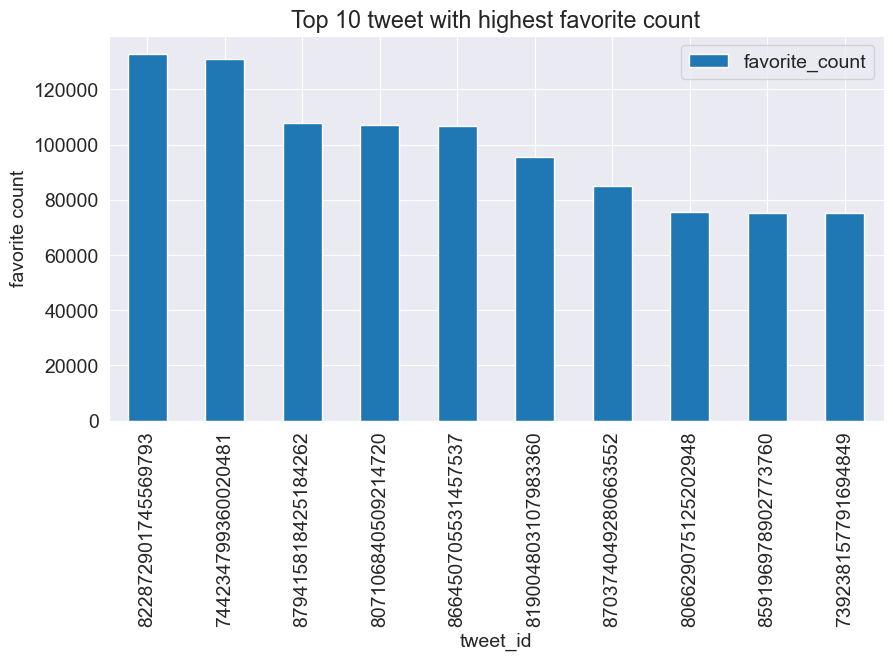

In [113]:
twitter_analysis.groupby('tweet_id')[['favorite_count']].sum().sort_values('favorite_count',ascending = False).head(10).plot(kind ='bar')
plt.title('Top 10 tweet with highest favorite count')
plt.ylabel('favorite count');

In [114]:
twitter_analysis.groupby('tweet_id')[['retweet_count']].sum().sort_values('retweet_count',ascending = False).head(10)
# Top 10 tweet_id by retweet counts

,retweet_count
tweet_id,
744234799360020481,79515
807106840509214720,56625
739238157791694849,52360
822872901745569793,48265
879415818425184262,45849
819004803107983360,42228
806629075125202948,37911
761672994376806400,33421
866450705531457537,32883


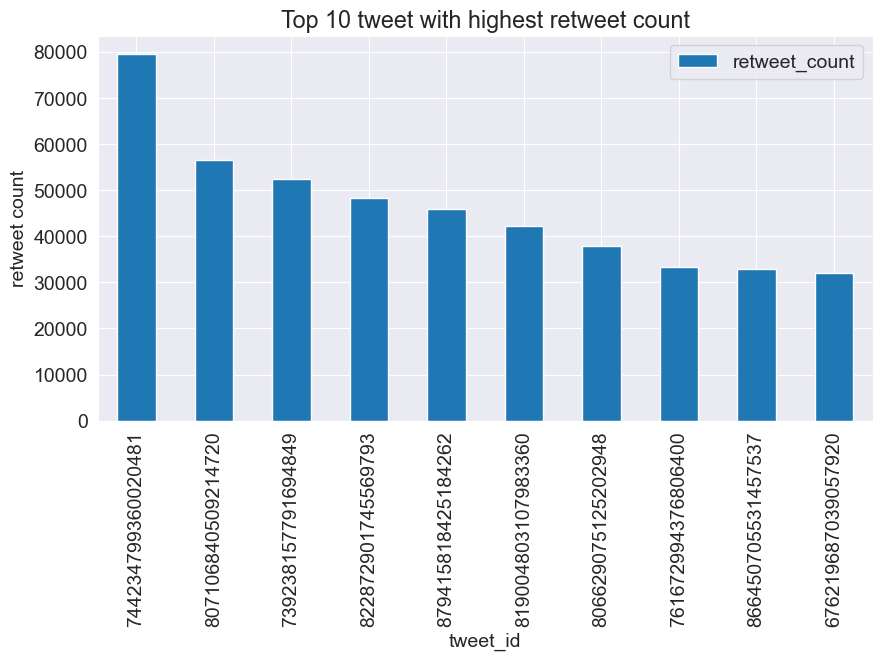

In [115]:
twitter_analysis.groupby('tweet_id')[['retweet_count']].sum().sort_values('retweet_count',ascending = False).head(10).plot(kind ='bar')
plt.title('Top 10 tweet with highest retweet count')
plt.ylabel('retweet count');

In [116]:
twitter_analysis['dog_stage'].value_counts()

pupper     223
doggo       87
puppo       24
floofer      9
Name: dog_stage, dtype: int64

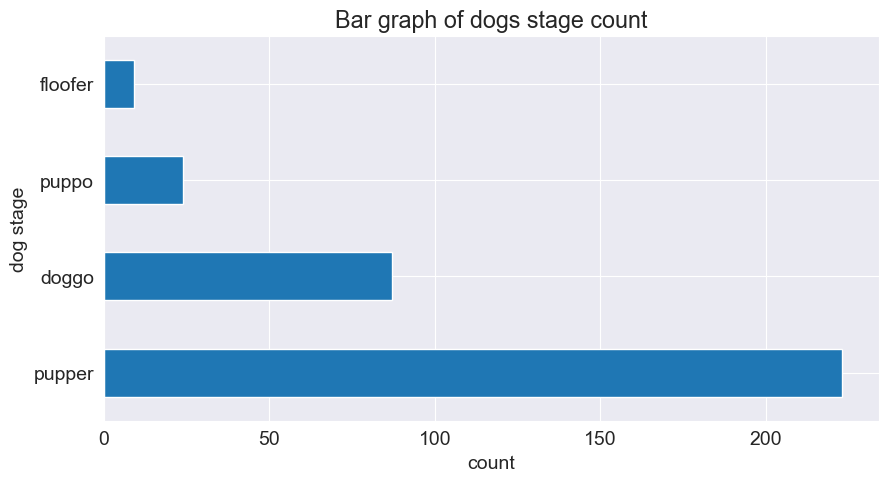

In [131]:
twitter_analysis['dog_stage'].value_counts().plot(kind = 'barh')
plt.title('Bar graph of dogs stage count')
plt.ylabel('dog stage')
plt.xlabel('count');

In [118]:
twitter_analysis['name'].value_counts()

a             54
Charlie       11
Lucy          11
Oliver        10
Cooper        10
              ..
Dixie          1
mad            1
Al             1
Carbon         1
Christoper     1
Name: name, Length: 954, dtype: int64

In [119]:
twitter_analysis.groupby('dog_stage')[['retweet_count', 'favorite_count']].mean()
#Average value of retweet/favorite count by dog stages

,retweet_count,favorite_count
dog_stage,,
doggo,6189.655172,17108.804598
floofer,4155.888889,11064.444444
pupper,2466.313901,7202.273543
puppo,6332.500000,20788.875000


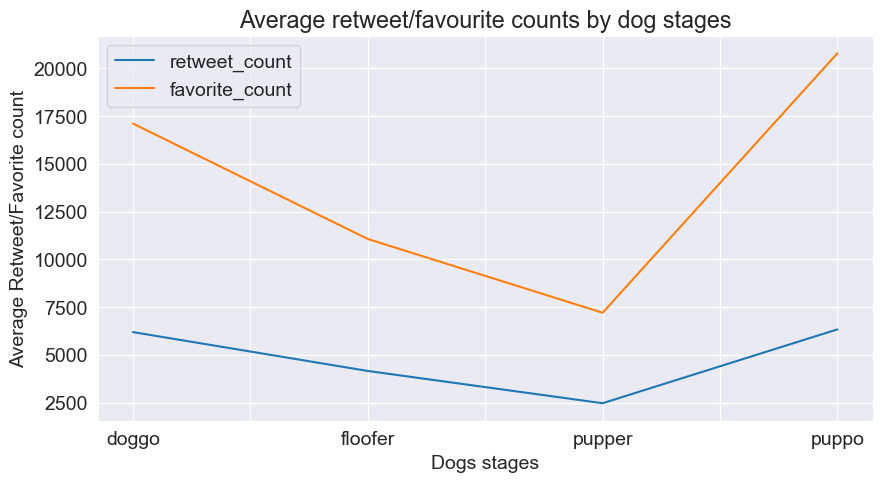

In [120]:
twitter_analysis.groupby('dog_stage')[['retweet_count', 'favorite_count']].mean().plot()
plt.title('Average retweet/favourite counts by dog stages')
plt.xlabel('Dogs stages')
plt.ylabel('Average Retweet/Favorite count');

In [121]:
def scatter_plot(df, x, y):
    return df.plot(x , y , kind = 'scatter')
def scatter_title(x,y) :
    return plt.title(f'Relationship between {x} and {y}')

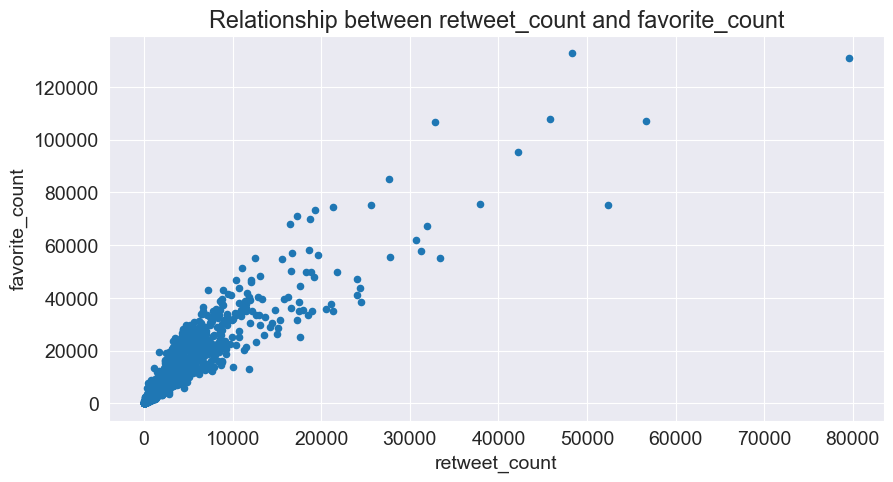

In [122]:
scatter_plot(twitter_analysis, 'retweet_count', 'favorite_count')
scatter_title('retweet_count', 'favorite_count');

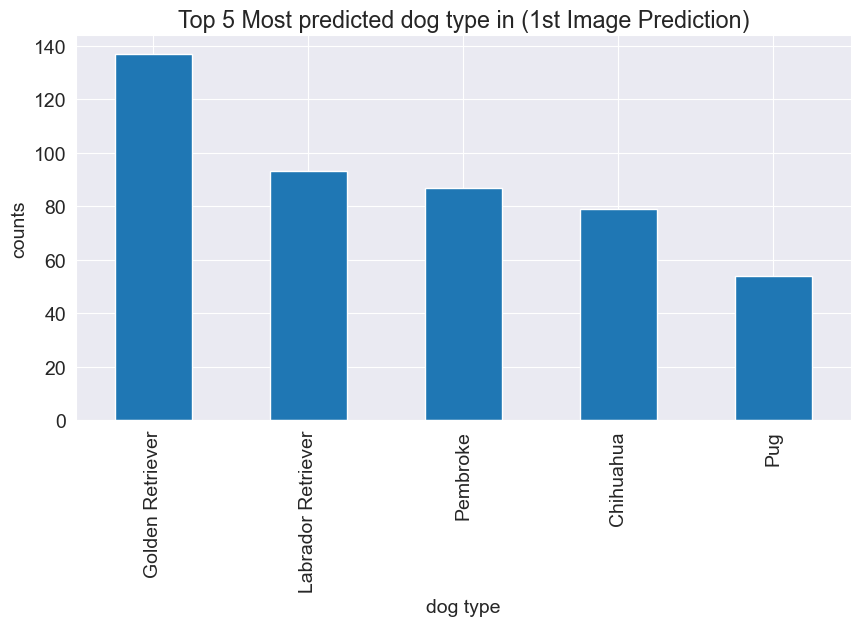

In [128]:
archive_clean3['1st_image_prediction'].value_counts().head().plot(kind='bar')
plt.title('Top 5 Most predicted dog type in (1st Image Prediction)')
plt.xlabel('dog type')
plt.ylabel('counts');

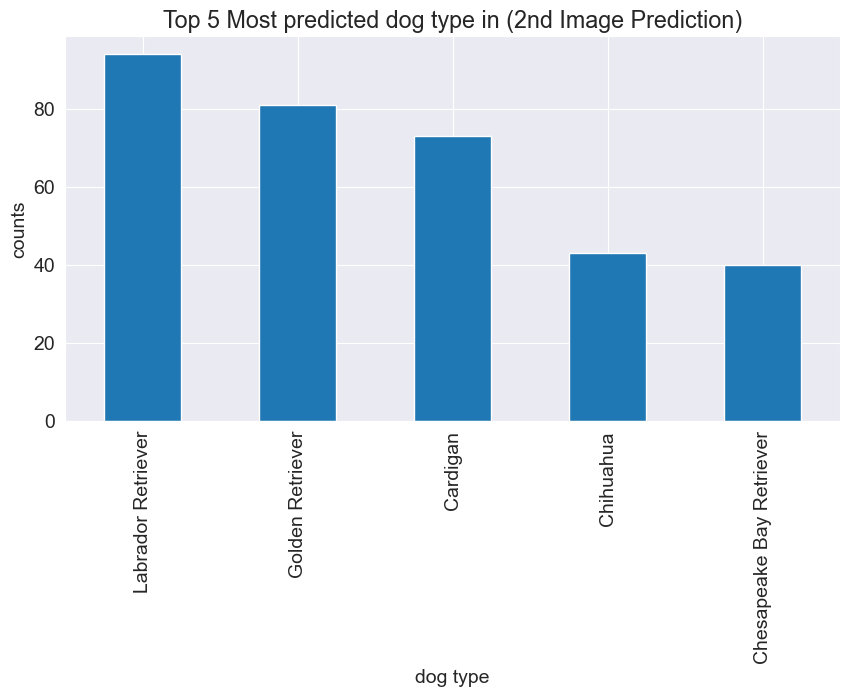

In [129]:
archive_clean3['2nd_image_prediction'].value_counts().head().plot(kind='bar')
plt.title('Top 5 Most predicted dog type in (2nd Image Prediction)')
plt.xlabel('dog type')
plt.ylabel('counts');

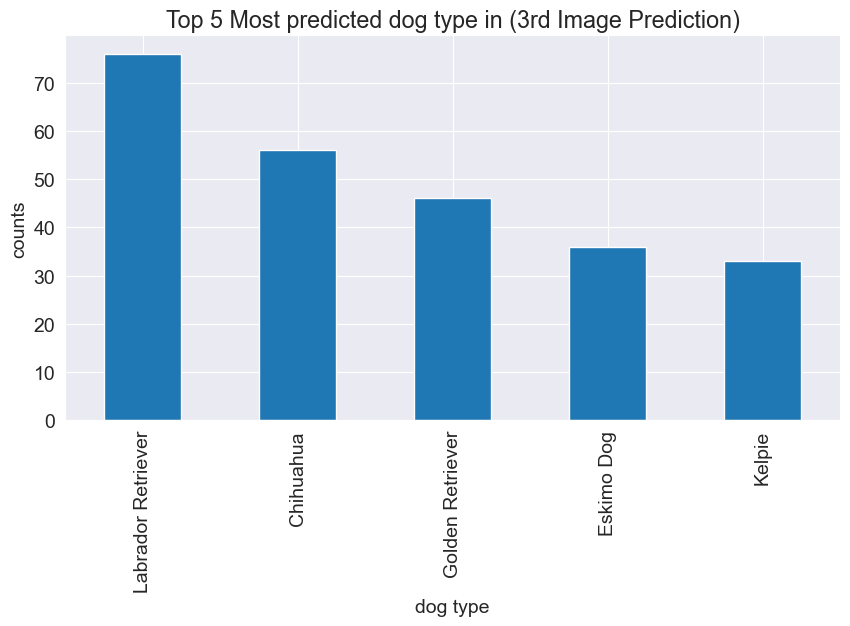

In [130]:
archive_clean3['3rd_image_prediction'].value_counts().head().plot(kind='bar')
plt.title('Top 5 Most predicted dog type in (3rd Image Prediction)')
plt.xlabel('dog type')
plt.ylabel('counts');

### Insights:
1. Tweets with high favorite counts tends to have high retweet counts.

2. Puppo and doggo are the most occured dog_category in the tweets and this accounts for their high favorite and retweet counts.

3. Labrador retriever, Chihuahua and Golden retriever are the most predicted dog type in all image prediction levels.

3. Most dogs were rated over 9.

### Visualization

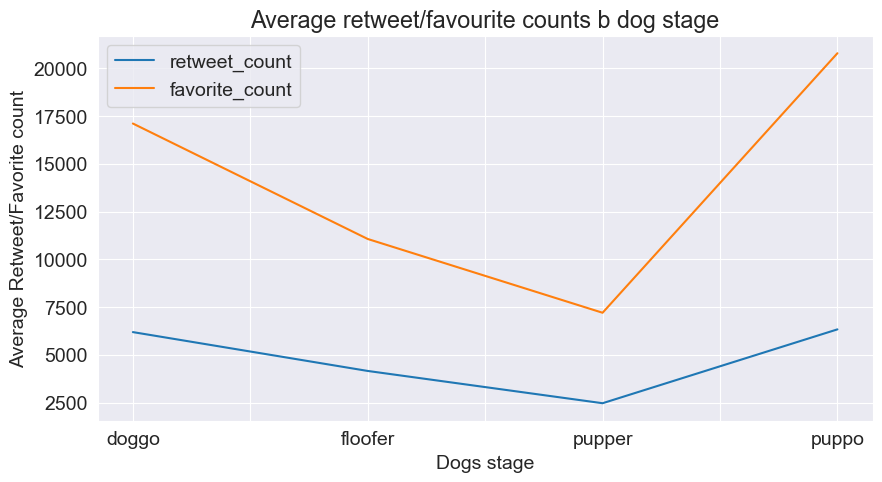

In [126]:
twitter_analysis.groupby('dog_stage')[['retweet_count', 'favorite_count']].mean().plot()
plt.title('Average retweet/favourite counts b dog stage')
plt.xlabel('Dogs stage')
plt.ylabel('Average Retweet/Favorite count');

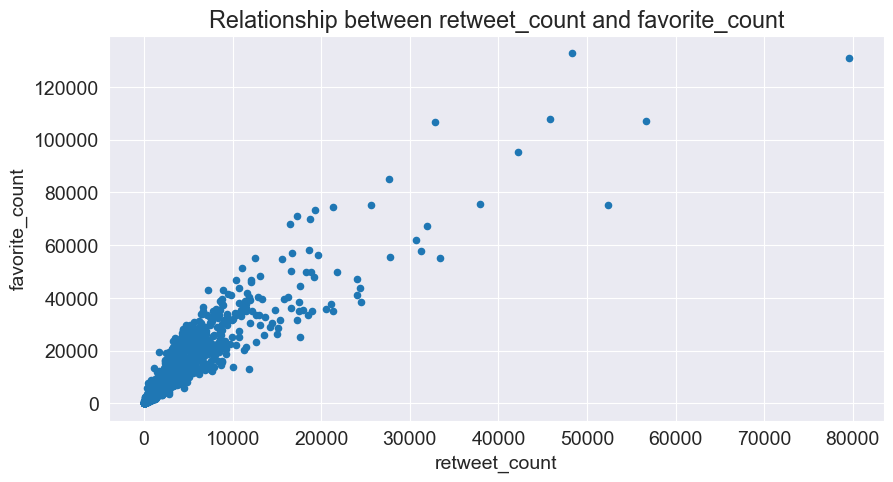

In [127]:
scatter_plot(twitter_analysis, 'retweet_count', 'favorite_count')
scatter_title('retweet_count', 'favorite_count');

Additional code

In [1]:
input('Are you learning')

Are you learningYes


'Yes'